In [1]:
import os
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE']='false'

import jax

from jax import random, jit, vmap, grad
from jax import numpy as jnp
from jax.lax import cond

import astropy
import numpy as np
import healpy as hp

import h5py
import astropy.units as u

from astropy.cosmology import Planck15, FlatLambdaCDM, z_at_value
import astropy.constants as constants
from jax.scipy.special import logsumexp
from scipy.interpolate import interp1d
from scipy.stats import gaussian_kde
from tqdm import tqdm

import matplotlib
%matplotlib inline

import matplotlib.pyplot as plt
matplotlib.rcParams['font.family'] = 'Times New Roman'
matplotlib.rcParams['font.sans-serif'] = ['Bitstream Vera Sans']
matplotlib.rcParams['text.usetex'] = False
matplotlib.rcParams['mathtext.fontset'] = 'cm'
matplotlib.rcParams['figure.figsize'] = (16.0, 10.0)
matplotlib.rcParams['axes.unicode_minus'] = False

import seaborn as sns
sns.set_context('talk')
sns.set_style('ticks')
sns.set_palette('colorblind')
c=sns.color_palette('colorblind')

jax.config.update("jax_enable_x64", True)
jax.config.update('jax_default_matmul_precision', 'highest')


In [2]:
from jaxinterp2d import interp2d, CartesianGrid

H0Planck = Planck15.H0.value
Om0Planck = Planck15.Om0

zMax = 5
zgrid = jnp.expm1(jnp.linspace(jnp.log(1), jnp.log(zMax+1), 1000))
Om0grid = jnp.linspace(Om0Planck-0.1,Om0Planck+0.1,50)

cosmo = FlatLambdaCDM(H0=H0Planck,Om0=Planck15.Om0)
speed_of_light = constants.c.to('km/s').value

rs = []
for Om0 in tqdm(Om0grid):
    cosmo = FlatLambdaCDM(H0=H0Planck,Om0=Om0)
    rs.append(cosmo.comoving_distance(zgrid).to(u.Mpc).value)

rs = jnp.asarray(rs)
rs = rs.reshape(len(Om0grid),len(zgrid))

@jit
def E(z,Om0=Om0Planck):
    return jnp.sqrt(Om0*(1+z)**3 + (1.0-Om0))

@jit
def r_of_z(z,H0,Om0=Om0Planck):
    return interp2d(Om0,z,Om0grid,zgrid,rs)*(H0Planck/H0)

@jit
def dL_of_z(z,H0,Om0=Om0Planck):
    return (1+z)*r_of_z(z,H0,Om0)

@jit
def z_of_dL(dL,H0,Om0=Om0Planck):
    return jnp.interp(dL,dL_of_z(zgrid,H0,Om0),zgrid)

@jit
def dV_of_z(z,H0,Om0=Om0Planck):
    return speed_of_light*r_of_z(z,H0,Om0)**2/(H0*E(z,Om0))

@jit
def ddL_of_z(z,dL,H0,Om0=Om0Planck):
    return dL/(1+z) + speed_of_light*(1+z)/(H0*E(z,Om0))

2025-02-14 17:15:54.862831: W external/xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.3 which is older than the PTX compiler version 12.6.77. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.
100%|██████████| 50/50 [00:00<00:00, 197.45it/s]


In [3]:
import pickle

# open a file, where you ant to store the data
file = open('PLPLB-spin','rb')
dres = pickle.load(file)


In [4]:
import pickle
from dynesty.utils import resample_equal
from dynesty import NestedSampler, DynamicNestedSampler
import multiprocessing as multi
import corner 

dlogZdynesty = dres.logz[-1]        # value of logZ
dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ

# output marginal likelihood
print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

# get the posterior samples
dweights = np.exp(dres['logwt'] - dres['logz'][-1])
dpostsamples = resample_equal(dres.samples, dweights)

print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))


Marginalised evidence (using dynamic sampler) is -1514.5218952852692 ± 0.08067391525534218
Number of posterior samples (using dynamic sampler) is 80163


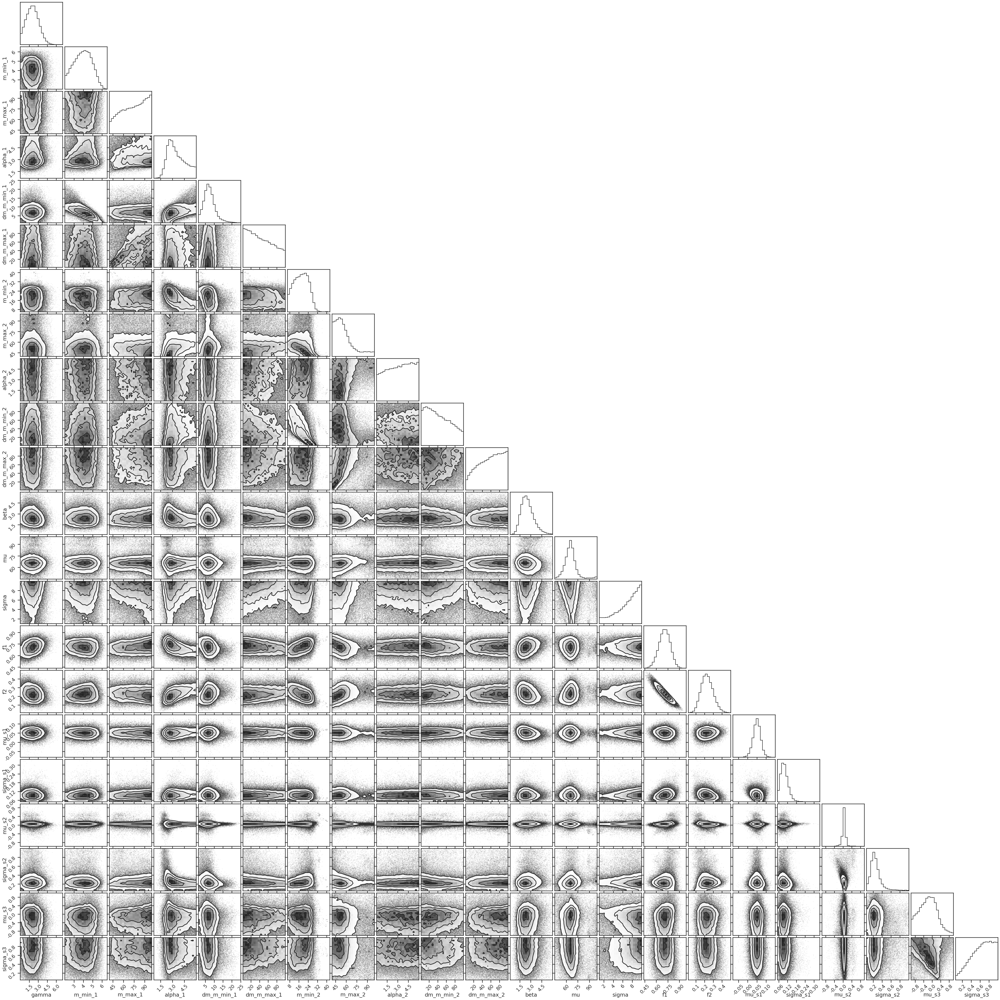

In [5]:
labels = [#'H0','Om0',
    'gamma','m_min_1','m_max_1','alpha_1','dm_m_min_1','dm_m_max_1','m_min_2','m_max_2',
    'alpha_2','dm_m_min_2','dm_m_max_2','beta','mu','sigma','f1','f2','mu_s1', 'sigma_s1','mu_s2', 'sigma_s2','mu_s3', 'sigma_s3']

fig = corner.corner(dpostsamples, labels=labels, hist_kwargs={'density': True})
plt.show()

In [6]:
gamma_1 = dpostsamples[:,0]
mmin_1 = dpostsamples[:,1]
mmax_1 = dpostsamples[:,2]
alpha_1 = dpostsamples[:,3]
dm_mmin_1 = dpostsamples[:,4]
dm_mmax_1 = dpostsamples[:,5]
mmin_2 = dpostsamples[:,6]
mmax_2 = dpostsamples[:,7]
alpha_2 = dpostsamples[:,8]
dm_mmin_2 = dpostsamples[:,9]
dm_mmax_2 = dpostsamples[:,10]
beta = dpostsamples[:,11]
mu = dpostsamples[:,12]
sigma = dpostsamples[:,13]
f1 = dpostsamples[:,14]
f2 = dpostsamples[:,15]
mus1 = dpostsamples[:,16]
std1 = dpostsamples[:,17]
mus2 = dpostsamples[:,18]
std2 = dpostsamples[:,19]
mus3 = dpostsamples[:,20]
std3 = dpostsamples[:,21]


/hildafs/home/magana/tmp_ondemand_hildafs_phy230014p_symlink/magana/.conda/envs/jax/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/hildafs/home/magana/tmp_ondemand_hildafs_phy230014p_symlink/magana/.conda/envs/jax/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/hildafs/home/magana/tmp_ondemand_hildafs_phy230014p_symlink/magana/.conda/envs/jax/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na',

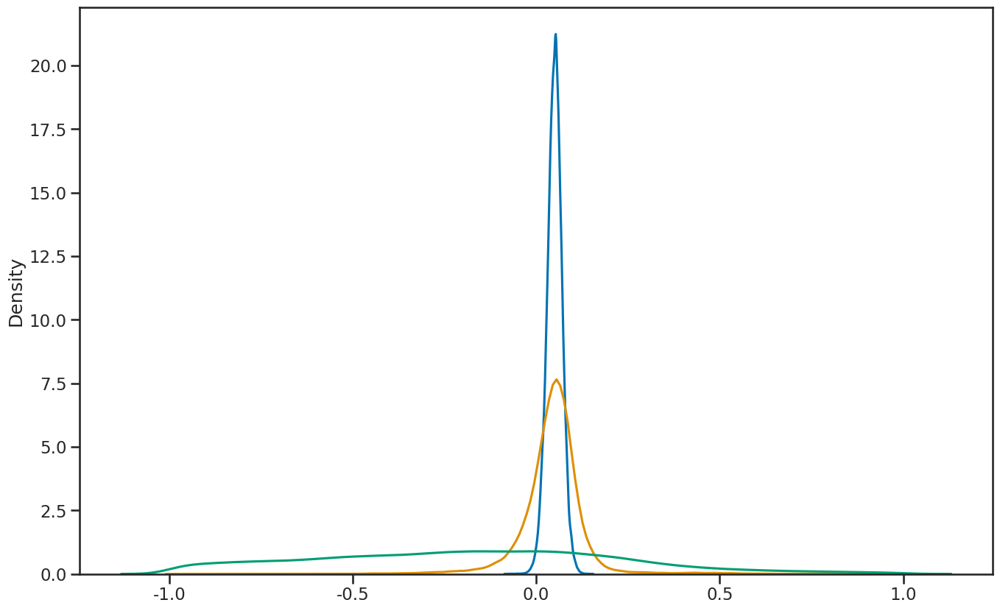

In [7]:
sns.kdeplot(mus1)
sns.kdeplot(mus2)
sns.kdeplot(mus3)
plt.show()

In [8]:
chieff_grid = jnp.linspace(-1, 1, 2000)


@jit
def logpchieff(chieff,mu_chieff,sigma_chieff):
    pchieff =  jnp.exp(-(chieff_grid - mu_chieff)**2 / (2 * sigma_chieff ** 2))
    pchieff = pchieff/jnp.trapezoid(pchieff,chieff_grid)
    return jnp.log(jnp.interp(chieff,chieff_grid,pchieff))

pchieff_1 = []
pchieff_2 = []
pchieff_3 = []
for k in tqdm(range(len(gamma_1))):
    pchieff_1.append(np.exp(logpchieff(chieff_grid,mus1[k],std1[k])))
    pchieff_2.append(np.exp(logpchieff(chieff_grid,mus2[k],std2[k])))
    pchieff_3.append(np.exp(logpchieff(chieff_grid,mus3[k],std3[k])))


100%|██████████| 80163/80163 [09:13<00:00, 144.75it/s]


100%|██████████| 80163/80163 [00:32<00:00, 2475.14it/s]


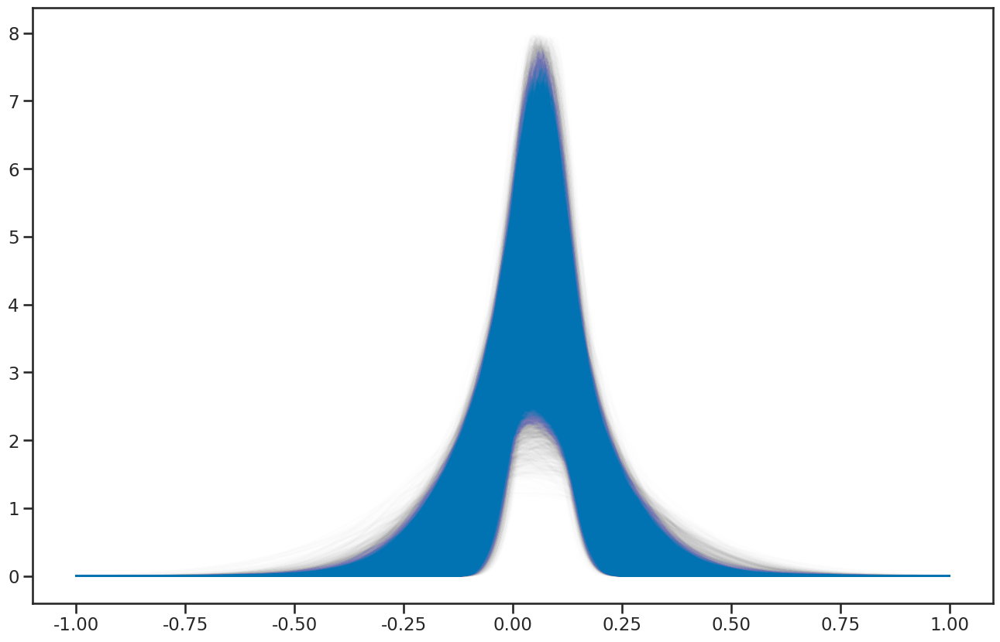

In [9]:
for k in tqdm(range(len(gamma_1))):
    plt.plot(chieff_grid,pchieff_1[k],alpha=0.004,color=c[0])
plt.show()

In [10]:
plplbump_pm1s_ = np.array(pchieff_1)

pchieff_5_1 = np.percentile(plplbump_pm1s_,q=5,axis=0)
pchieff_95_1 = np.percentile(plplbump_pm1s_,q=95,axis=0)
pchieff_med_1 = np.percentile(plplbump_pm1s_,q=50,axis=0)

plplbump_pm1s_ = np.array(pchieff_2)

pchieff_5_2 = np.percentile(plplbump_pm1s_,q=5,axis=0)
pchieff_95_2 = np.percentile(plplbump_pm1s_,q=95,axis=0)
pchieff_med_2 = np.percentile(plplbump_pm1s_,q=50,axis=0)

plplbump_pm1s_ = np.array(pchieff_3)

pchieff_5_3 = np.percentile(plplbump_pm1s_,q=5,axis=0)
pchieff_95_3 = np.percentile(plplbump_pm1s_,q=95,axis=0)
pchieff_med_3 = np.percentile(plplbump_pm1s_,q=50,axis=0)

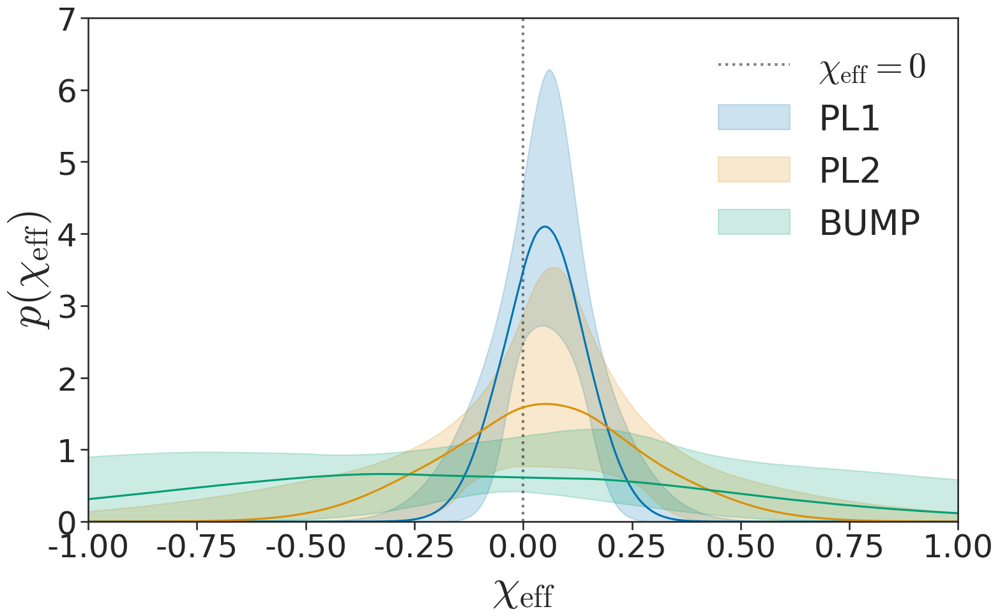

In [11]:

def chieff_spectrum_plot():
    """
    Generates a plot of the PPD and X% credible region for the mass distribution,
    where X=limits[1]-limits[0]
    """
    fig, axs = plt.subplots(figsize=(16,10))
    plt.axvline(0,color='black',label=r"$\chi_{\rm{eff}}=0$",alpha=0.5, ls=':',linewidth=3)

    axs.fill_between(chieff_grid,pchieff_5_1,pchieff_95_1,alpha=0.2,color=c[0],label="PL1")
    axs.fill_between(chieff_grid,pchieff_5_2,pchieff_95_2,alpha=0.2,color=c[1],label="PL2")
    axs.fill_between(chieff_grid,pchieff_5_3,pchieff_95_3,alpha=0.2,color=c[2],label="BUMP")

    axs.plot(chieff_grid,pchieff_med_1,color=c[0])
    axs.plot(chieff_grid,pchieff_med_2,color=c[1])
    axs.plot(chieff_grid,pchieff_med_3,color=c[2])

    axs.set_xlim(-1,1)
    axs.set_ylim(0,7)
    axs.set_xlabel(r"$\chi_{\rm{eff}}$",fontsize=50)
    axs.legend(loc="best",fontsize=40,frameon=False)
    ylabel = r"$p(\chi_{\rm{eff}})$"#" [$M_{\\odot}^{-1}$]"
    axs.set_ylabel(ylabel,fontsize=50)
    plt.xticks(fontsize=36)
    plt.yticks(fontsize=36)
    #axs.set_yscale('log')
    plt.tight_layout()
    plt.savefig('figure1_chieff_normed.pdf')
    plt.savefig('figure1_chieff_normed.png')
    return fig
fig = chieff_spectrum_plot()
plt.show()

In [12]:
from jax.scipy.stats.norm import cdf

pchieff_1_cdf = []
pchieff_2_cdf = []
pchieff_3_cdf = []
for k in tqdm(range(len(gamma_1))):
    pchieff_1_cdf.append(cdf(chieff_grid,mus1[k],std1[k]))
    pchieff_2_cdf.append(cdf(chieff_grid,mus2[k],std2[k]))
    pchieff_3_cdf.append(cdf(chieff_grid,mus3[k],std3[k]))


100%|██████████| 80163/80163 [05:45<00:00, 231.70it/s]


In [13]:
plplbump_pm1s_ = np.array(pchieff_1_cdf)

pchieff_5_1_cdf = np.percentile(plplbump_pm1s_,q=5,axis=0)
pchieff_95_1_cdf = np.percentile(plplbump_pm1s_,q=95,axis=0)
pchieff_med_1_cdf = np.percentile(plplbump_pm1s_,q=50,axis=0)

plplbump_pm1s_ = np.array(pchieff_2_cdf)

pchieff_5_2_cdf = np.percentile(plplbump_pm1s_,q=5,axis=0)
pchieff_95_2_cdf = np.percentile(plplbump_pm1s_,q=95,axis=0)
pchieff_med_2_cdf = np.percentile(plplbump_pm1s_,q=50,axis=0)

plplbump_pm1s_ = np.array(pchieff_3_cdf)

pchieff_5_3_cdf = np.percentile(plplbump_pm1s_,q=5,axis=0)
pchieff_95_3_cdf = np.percentile(plplbump_pm1s_,q=95,axis=0)
pchieff_med_3_cdf = np.percentile(plplbump_pm1s_,q=50,axis=0)

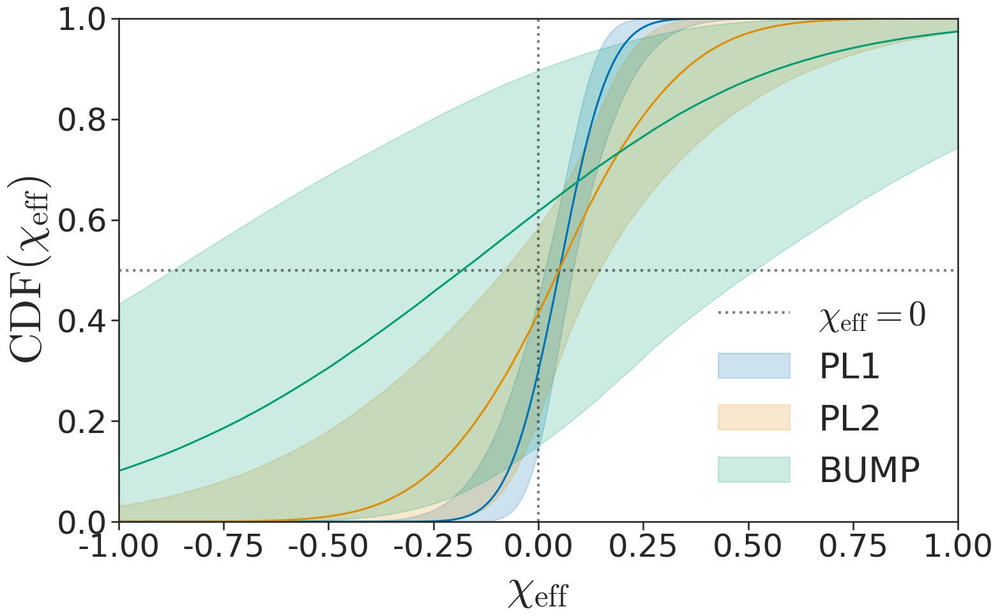

In [14]:

def chieff_cdf_plot():
    """
    Generates a plot of the PPD and X% credible region for the mass distribution,
    where X=limits[1]-limits[0]
    """
    fig, axs = plt.subplots(figsize=(16,10))
    plt.axvline(0,color='black',label=r"$\chi_{\rm{eff}}=0$",alpha=0.5, ls=':',linewidth=3)
    plt.axhline(0.5,color='black',alpha=0.5, ls=':',linewidth=3)

    axs.fill_between(chieff_grid,pchieff_5_1_cdf,pchieff_95_1_cdf,alpha=0.2,color=c[0],label="PL1")
    axs.fill_between(chieff_grid,pchieff_5_2_cdf,pchieff_95_2_cdf,alpha=0.2,color=c[1],label="PL2")
    axs.fill_between(chieff_grid,pchieff_5_3_cdf,pchieff_95_3_cdf,alpha=0.2,color=c[2],label="BUMP")

    axs.plot(chieff_grid,pchieff_med_1_cdf,color=c[0])
    axs.plot(chieff_grid,pchieff_med_2_cdf,color=c[1])
    axs.plot(chieff_grid,pchieff_med_3_cdf,color=c[2])

    axs.set_xlim(-1,1)
    axs.set_ylim(0,1)
    axs.set_xlabel(r"$\chi_{\rm{eff}}$",fontsize=50)
    axs.legend(loc="lower right",fontsize=40,frameon=False)
    ylabel = r"${\rm{CDF}}(\chi_{\rm{eff}})$"
    axs.set_ylabel(ylabel,fontsize=50)
    plt.xticks(fontsize=36)
    plt.yticks(fontsize=36)
    plt.tight_layout()
    plt.savefig('figure1_chieff_cdf.pdf')
    plt.savefig('figure1_chieff_cdf.png')
    return fig
    
fig = chieff_cdf_plot()
plt.show()

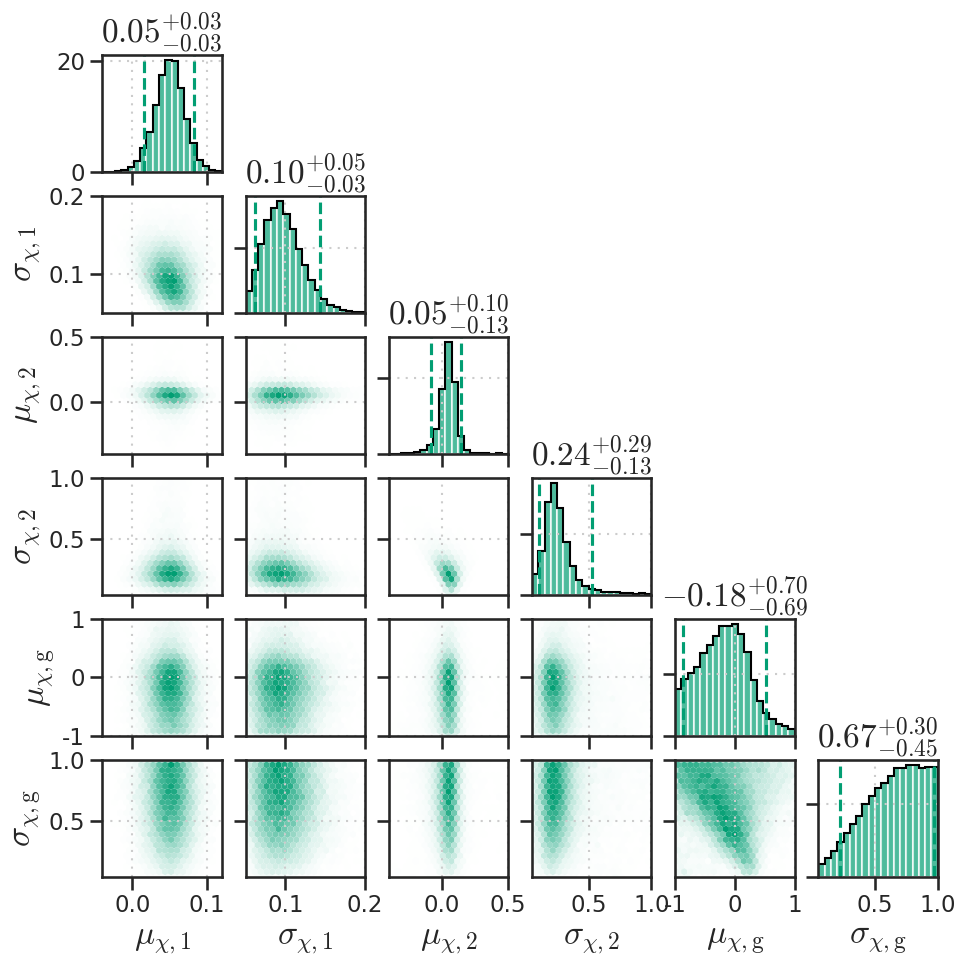

In [15]:
from makeCorner2 import plot_corner

labels_plot_peak = [r"$\mu_{\chi,1}$", r"$\sigma_{\chi,1}$",  r"$\mu_{\chi,2}$", r"$\sigma_{\chi,2}$", r"$\mu_{\chi,\rm{g}}$", r"$\sigma_{\chi,\rm{g}}$",]


plot_data = {
    'mu1':{'data':mus1,'plot_bounds':(-0.04,0.12),'label':labels_plot_peak[0]},
    'sigma1':{'data':std1,'plot_bounds':(0.05,0.2),'label':labels_plot_peak[1]},
    'mu2':{'data':mus2,'plot_bounds':(-0.4,0.5),'label':labels_plot_peak[2]},
    'sigma2':{'data':std2,'plot_bounds':(0.05,1),'label':labels_plot_peak[3]},
    'mu3':{'data':mus3,'plot_bounds':(-1,1),'label':labels_plot_peak[4]},
    'sigma3':{'data':std3,'plot_bounds':(0.05,1),'label':labels_plot_peak[5]}
}

fig = plt.figure(figsize=(10,10))
plot_corner(fig,plot_data,c[2],labelsize=24,title_size=24)

plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.savefig('chieff_corner.pdf',bbox_inches='tight',dpi=200)
plt.show()

In [16]:
from gwpopulation.models import mass as mass_models
import bilby
from scipy.integrate import cumtrapz

Nsamples = 1000

underlying_pop = {"mmin": 6, "alpha": 4, "beta_q": 1.5, "mmax": 70, "lam": 0.04, "mpp": 35, "sigpp": 4, "delta_m": 4.0, "lamb": 3}

ms = np.linspace(0.1, 150, 1000)

m1_pdf = mass_models.SinglePeakSmoothedMassDistribution().p_m1({"mass_1":ms}, 
                                                        alpha=underlying_pop["alpha"],
                                                        mmin=underlying_pop["mmin"],
                                                        delta_m=underlying_pop["delta_m"],
                                                        mpp=underlying_pop["mpp"],                                             
                                                        sigpp=underlying_pop["sigpp"],
                                                        mmax=underlying_pop["mmax"],
                                                        lam=underlying_pop["lam"])


m1_cdf = cumtrapz(m1_pdf, ms, initial=0)
m1_cdf/=m1_cdf[-1]

m1_samples = interp1d(m1_cdf,ms)(np.random.rand(Nsamples))

m1_samples = m1_samples[np.where(m1_samples>underlying_pop["mmin"])[0]]
Nsamples = len(m1_samples)


q_samples = np.array([bilby.core.prior.analytical.PowerLaw(alpha=underlying_pop['beta_q'],
                                                           minimum=underlying_pop["mmin"]/m1, maximum=1).sample(size=1)[0] for m1 in m1_samples])

/tmp/ipykernel_2095444/1868948362.py:21: DeprecationWarning: 'scipy.integrate.cumtrapz' is deprecated in favour of 'scipy.integrate.cumulative_trapezoid' and will be removed in SciPy 1.14.0
  m1_cdf = cumtrapz(m1_pdf, ms, initial=0)


In [17]:

m1s,m2s = np.meshgrid(ms,ms)


pm1s = mass_models.SinglePeakSmoothedMassDistribution().p_m1( {"mass_1":m1s},
                                                        alpha=underlying_pop["alpha"],
                                                        mmin=underlying_pop["mmin"],
                                                        delta_m=underlying_pop["delta_m"],
                                                        mpp=underlying_pop["mpp"],                                             
                                                        sigpp=underlying_pop["sigpp"],
                                                        mmax=underlying_pop["mmax"],
                                                        lam=underlying_pop["lam"])
pqs = mass_models.SinglePeakSmoothedMassDistribution().p_q({"mass_1":m1s,"mass_ratio":m2s/m1s},beta=underlying_pop['beta_q'],delta_m=underlying_pop["delta_m"],mmin=underlying_pop["mmin"])
pm1m2s = pm1s*pqs/m1s
pm1m2s[m1s<m2s]=0.
pm1m2s/=np.trapz(np.trapz(pm1m2s,ms,axis=0),ms)

/hildafs/home/magana/tmp_ondemand_hildafs_phy230014p_symlink/magana/.conda/envs/jax/lib/python3.11/site-packages/gwpopulation/models/mass.py:631: RuntimeWarning: invalid value encountered in divide
  p_q /= self.norm_p_q(beta=beta, mmin=mmin, delta_m=delta_m)


In [18]:
pm1=np.trapz(pm1m2s,ms,axis=0)
pm2=np.trapz(pm1m2s,ms,axis=1)

pm1 = pm1/np.trapz(pm1,ms)
pm2 = pm2/np.trapz(pm2,ms)
plt.loglog(ms,pm1)
plt.loglog(ms,pm2)
plt.xlim(3,100)
plt.ylim(1e-4,1)

(0.0001, 1)

In [19]:
from jax.scipy.stats import norm

mass = jnp.linspace(1, 250, 2000)
mass_ratio =  jnp.linspace(0, 1, 2000)
chieff_grid = jnp.linspace(-1, 1, 2000)

def Sfilter_low(m,m_min,dm_min):
    """
    Smoothed filter function

    See Eq. B5 in https://arxiv.org/pdf/2111.03634.pdf
    """
    def f(mm,deltaMM):
        return jnp.exp(deltaMM/mm + deltaMM/(mm-deltaMM))
    
    S_filter = 1./(f(m-m_min,dm_min) + 1.)
    S_filter = jnp.where(m<m_min+dm_min,S_filter,1.)
    S_filter = jnp.where(m>m_min,S_filter,0.)
    return S_filter

def Sfilter_high(m,m_max,dm_max):
    """
    Smoothed filter function

    See Eq. B5 in https://arxiv.org/pdf/2111.03634.pdf
    """
    def f(mm,deltaMM):
        return jnp.exp(deltaMM/mm + deltaMM/(mm-deltaMM))
    
    S_filter = 1./(f(m-m_max,-dm_max) + 1.)
    S_filter = jnp.where(m>m_max-dm_max,S_filter,1.)
    S_filter = jnp.where(m<m_max,S_filter,0.)
    return S_filter

@jit
def logpm1_powerlaw(m1,m_min,m_max,alpha,dm_min,dm_max):

    pm1 = Sfilter_low(mass,m_min,dm_min)*mass**(-alpha)*Sfilter_high(mass,m_max,dm_max)
    pm1 = pm1/jnp.trapezoid(pm1,mass)
    return jnp.log(jnp.interp(m1,mass,pm1))

@jit
def logpm1_peak(m1,mu,sigma):
    pm1 =  jnp.exp(-(mass - mu)**2 / (2 * sigma ** 2))
    pm1 = pm1/jnp.trapezoid(pm1,mass)
    return jnp.log(jnp.interp(m1,mass,pm1))

@jit
def logfq(m1,m2,beta):
    q = m2/m1
    pq = mass_ratio**beta
    pq = pq/jnp.trapezoid(pq,mass_ratio)

    log_pq = jnp.log(jnp.interp(q,mass_ratio,pq))

    return log_pq

@jit
def logpchieff(chieff,mu_chieff,sigma_chieff):
    pchieff =  jnp.exp(-(chieff_grid - mu_chieff)**2 / (2 * sigma_chieff ** 2))
    pchieff = pchieff/jnp.trapezoid(pchieff,chieff_grid)
    return jnp.log(jnp.interp(chieff,chieff_grid,pchieff))

@jit
def logpm1_powerlaw_powerlaw_peak(m1,chieff,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2,
                             mu_s1,sigma_s1,mu_s2,sigma_s2,mu_s3,sigma_s3):
    p1 = jnp.exp(logpm1_powerlaw(m1,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1))
    p2 = jnp.exp(logpm1_powerlaw(m1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2))
    p3 = jnp.exp(logpm1_peak(m1,mu,sigma))
    
    p1_s1 = jnp.exp(logpchieff(chieff,mu_s1,sigma_s1))
    p1_s2 = jnp.exp(logpchieff(chieff,mu_s2,sigma_s2))
    p1_s3 = jnp.exp(logpchieff(chieff,mu_s3,sigma_s3))
    
    pm1 = f1*p1*p1_s1 + f2*p2*p1_s2 + (1-f1-f2)*p3*p1_s3
    return jnp.log(pm1)

@jit
def log_pm1m2(m1,m2,chieff,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2,beta,mus1,std1,mus2,std2,mus3,std3):
    log_dNdm1 = logpm1_powerlaw_powerlaw_peak(m1,chieff,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2,mus1,std1,mus2,std2,mus3,std3)
    log_dNdm2 = logpm1_powerlaw_powerlaw_peak(m2,chieff,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2,mus1,std1,mus2,std2,mus3,std3)
    log_fq = logfq(m1,m2,beta)
    return log_dNdm1 + log_dNdm2 + log_fq 

In [20]:
pm1_fit_zlow = []
pm2_fit_zlow = []
for k in tqdm(range(1000)):
    pm1sm2s_fit = np.exp(log_pm1m2(m1s,m2s,-0.5,mmin_1[k],mmax_1[k],alpha_1[k],dm_mmin_1[k],dm_mmax_1[k],mmin_2[k],mmax_2[k],alpha_2[k],dm_mmin_2[k],dm_mmax_2[k],mu[k],sigma[k],f1[k],f2[k],beta[k],mus1[k],std1[k],mus2[k],std2[k],mus3[k],std3[k]))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit=np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit=np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    pm1_fit_zlow.append(pm1_fit)
    pm2_fit_zlow.append(pm2_fit)

100%|██████████| 1000/1000 [00:23<00:00, 42.25it/s]


In [21]:
pm1_fit_zlows = []
pm2_fit_zlows = []
for k in tqdm(range(1000)):
    pm1sm2s_fit = np.exp(log_pm1m2(m1s,m2s,0,mmin_1[k],mmax_1[k],alpha_1[k],dm_mmin_1[k],dm_mmax_1[k],mmin_2[k],mmax_2[k],alpha_2[k],dm_mmin_2[k],dm_mmax_2[k],mu[k],sigma[k],f1[k],f2[k],beta[k],mus1[k],std1[k],mus2[k],std2[k],mus3[k],std3[k]))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit=np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit=np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    pm1_fit_zlows.append(pm1_fit)
    pm2_fit_zlows.append(pm2_fit)

100%|██████████| 1000/1000 [00:23<00:00, 42.08it/s]


In [22]:
pm1_fit_zhigh = []
pm2_fit_zhigh = []
for k in tqdm(range(1000)):
    pm1sm2s_fit = np.exp(log_pm1m2(m1s,m2s,0.5,mmin_1[k],mmax_1[k],alpha_1[k],dm_mmin_1[k],dm_mmax_1[k],mmin_2[k],mmax_2[k],alpha_2[k],dm_mmin_2[k],dm_mmax_2[k],mu[k],sigma[k],f1[k],f2[k],beta[k],mus1[k],std1[k],mus2[k],std2[k],mus3[k],std3[k]))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit=np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit=np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    pm1_fit_zhigh.append(pm1_fit)
    pm2_fit_zhigh.append(pm2_fit)

100%|██████████| 1000/1000 [00:22<00:00, 44.73it/s]


In [23]:
plplbump_pm1s_ = np.array(pm1_fit_zlow)

plplbump_m1s_5_zlow = np.percentile(plplbump_pm1s_,q=5,axis=0)
plplbump_m1s_95_zlow = np.percentile(plplbump_pm1s_,q=95,axis=0)
plplbump_m1s_med_zlow = np.percentile(plplbump_pm1s_,q=50,axis=0)

plplbump_pm1s_ = np.array(pm1_fit_zlows)

plplbump_m1s_5_zlows = np.percentile(plplbump_pm1s_,q=5,axis=0)
plplbump_m1s_95_zlows = np.percentile(plplbump_pm1s_,q=95,axis=0)
plplbump_m1s_med_zlows = np.percentile(plplbump_pm1s_,q=50,axis=0)

plplbump_pm1s_ = np.array(pm1_fit_zhigh)

plplbump_m1s_5_zhigh = np.percentile(plplbump_pm1s_,q=5,axis=0)
plplbump_m1s_95_zhigh = np.percentile(plplbump_pm1s_,q=95,axis=0)
plplbump_m1s_med_zhigh = np.percentile(plplbump_pm1s_,q=50,axis=0)

dict_keys(['injected', 'lines', 'ppd'])
dict_keys(['mass_1', 'mass_ratio'])
['ms', 'pm1s', 'pm2s', 'pzs', 'zs']


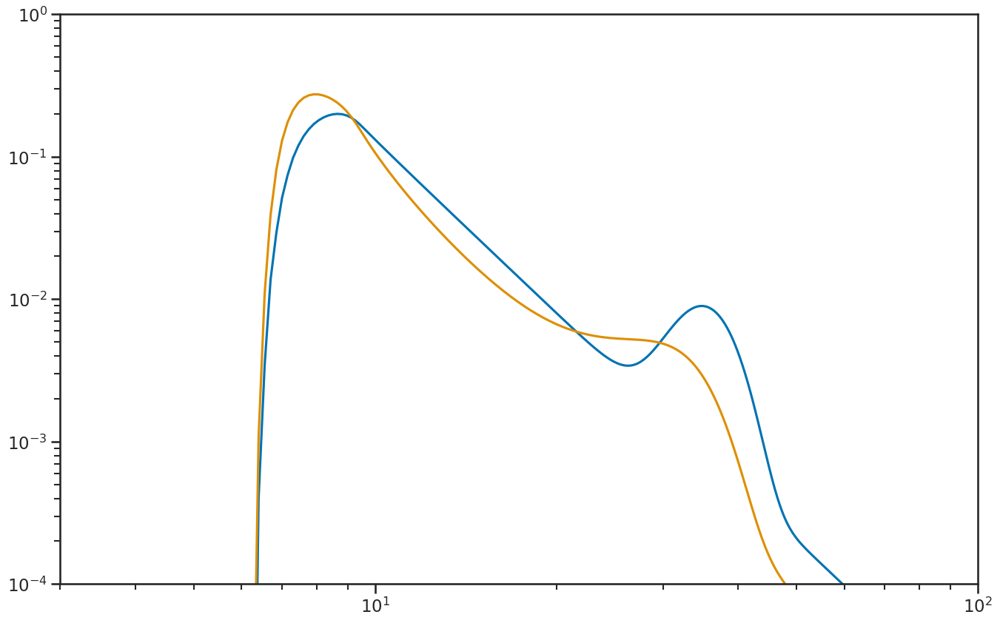

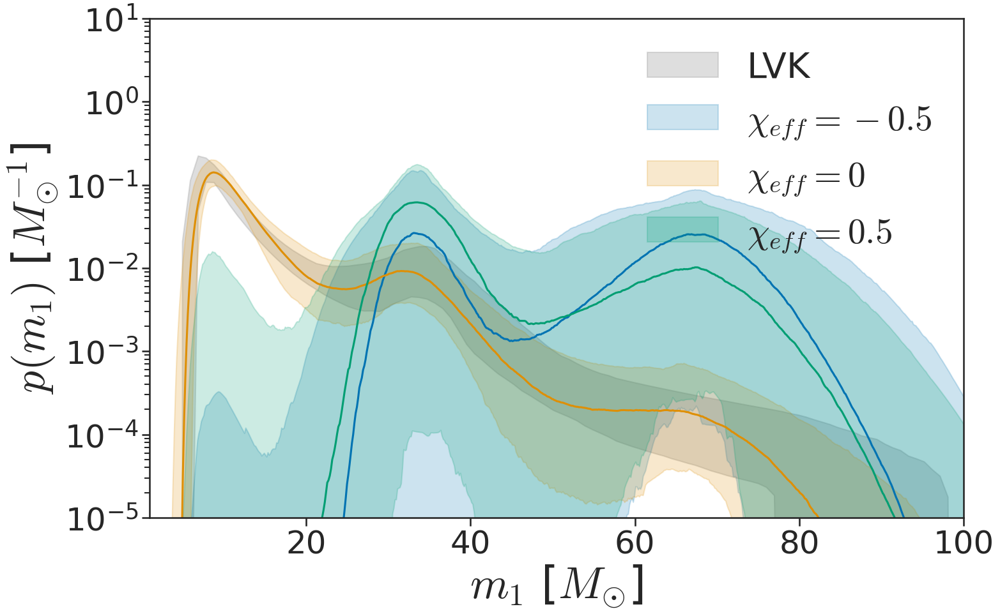

In [24]:
import deepdish as dd

mass_PP_path = '../../gppop/gwtc3/analyses/PowerLawPeak/o1o2o3_mass_c_iid_mag_iid_tilt_powerlaw_redshift_mass_data.h5'
with open(mass_PP_path, 'r') as _data:
    _data = dd.io.load(mass_PP_path)
    print(_data.keys())
    print(_data['lines'].keys())

with h5py.File('../../gppop/gwtc3/GWTC-3-param-pm1m2z.h5','r') as f:
    print(list(f.keys()))
    ms_ = np.array(f['ms'])
    zs = np.array(f['zs'])
    Rz = np.array(f['pzs'])
    Rpm1_GWTC3 = np.array(f['pm1s'])#*ms_
    Rpm2_GWTC3 = np.array(f['pm2s'])#*ms_
    
Rpm1_GWTC3/=np.trapz(Rpm1_GWTC3,ms_,axis=1)[:,None]
def mass_1_spectrum_plot(filenames, limits, labels):
    """
    Generates a plot of the PPD and X% credible region for the mass distribution,
    where X=limits[1]-limits[0]
    """
    mass_1 = np.linspace(2, 100, 1000)
    mass_ratio = np.linspace(0.1, 1, 500)
    mass_1_grid, mass_ratio_grid = np.meshgrid(mass_1, mass_ratio)

    fig, axs = plt.subplots(figsize=(16,10))

    for filename, label in zip(filenames, labels):
        with open(filename, 'r') as _data:
            _data = dd.io.load(filename)
            lines = _data["lines"]
            ppd = _data["ppd"]

        # marginalize over q to get the ppd in terms of m1 only
        mass_1_ppd = np.trapz(ppd, mass_ratio, axis=0)
        mass_1_ppd = mass_1_ppd / np.trapz(mass_1_ppd, mass_1)

        lines = lines['mass_1'] /  np.trapz(lines['mass_1'], mass_1)[:, np.newaxis]

        #marginalize over m1 to get the ppd in terms of q only
        mass_ratio_ppd = np.trapz(ppd, mass_1, axis=-1)
        mass_1_ppd = mass_1_ppd*mass_1 / np.trapz(mass_1_ppd*mass_1,mass_1)

        axs.fill_between(
            ms_,
            np.percentile(Rpm1_GWTC3, limits[0], axis=0),
            np.percentile(Rpm1_GWTC3, limits[1], axis=0),
            alpha=0.3, label=label, color=c[7]
        )


    axs.fill_between(ms,plplbump_m1s_5_zlow,plplbump_m1s_95_zlow,alpha=0.2,color=c[0],label="$\chi_{eff}=-0.5$")
    axs.fill_between(ms,plplbump_m1s_5_zlows,plplbump_m1s_95_zlows,alpha=0.2,color=c[1],label="$\chi_{eff}=0$")
    axs.fill_between(ms,plplbump_m1s_5_zhigh,plplbump_m1s_95_zhigh,alpha=0.2,color=c[2],label="$\chi_{eff}=0.5$")
    axs.plot(ms,plplbump_m1s_med_zlow,color=c[0])
    axs.plot(ms,plplbump_m1s_med_zlows,color=c[1])
    axs.plot(ms,plplbump_m1s_med_zhigh,color=c[2])
    axs.set_xlim(1,100)
    axs.set_ylim(1e-5,10)
    axs.set_xlabel("$m_{1}$ [$M_{\\odot}$]",fontsize=50)
    axs.legend(loc="best",fontsize=40,frameon=False)
    ylabel = "$p(m_1)$ [$M_{\\odot}^{-1}$]"
    axs.set_ylabel(ylabel,fontsize=50)
    plt.xticks(fontsize=36)
    plt.yticks(fontsize=36)
    axs.set_yscale('log')
    plt.tight_layout()
#     plt.savefig('figure1_m1_normed.pdf')
#     plt.savefig('figure1_m1_normed.png')  
    return fig
    
fig = mass_1_spectrum_plot([mass_PP_path], limits=[5,95], labels=['LVK'])
plt.show()